In [ ]:
pwd


'/data/users/jupyter-shr624/LobePrior_Project'

In [ ]:
!mkdir -p /data/users/jupyter-shr624/LobePrior_Project_image3


In [ ]:
%cd /data/users/jupyter-shr624/LobePrior_Project


/data/users/jupyter-shr624/LobePrior_Project


In [ ]:
!pwd


/data/users/jupyter-shr624/LobePrior_Project


In [ ]:
!git clone https://github.com/MICLab-Unicamp/LobePrior


Cloning into 'LobePrior'...
remote: Enumerating objects: 1024, done.
remote: Counting objects: 100% (80/80), done.
remote: Compressing objects: 100% (70/70), done.
remote: Total 1024 (delta 48), reused 23 (delta 10), pack-reused 944 (from 1)
Receiving objects: 100% (1024/1024), 34.97 MiB | 36.61 MiB/s, done.
Resolving deltas: 100% (629/629), done.


In [ ]:
!pip install -q SimpleITK torchio torchvision nibabel connected-components-3d pydicom scipy dipy pytorch_lightning monai matplotlib scikit-image tensorboard psutil

print("Dependencies installed!")

Dependencies installed!


In [ ]:
!wget -q --show-progress https://github.com/MICLab-Unicamp/LobePrior/releases/download/LobePrior/data.zip


data.zip            100%[===================>]   1.03G  57.8MB/s    in 19s     


In [ ]:
!sudo apt-get update -y
!sudo apt-get install -y unzip

print("\n Extracting weights...")
!unzip -q data.zip

sudo: The "no new privileges" flag is set, which prevents sudo from running as root.
sudo: If sudo is running in a container, you may need to adjust the container configuration to disable the flag.
sudo: The "no new privileges" flag is set, which prevents sudo from running as root.
sudo: If sudo is running in a container, you may need to adjust the container configuration to disable the flag.

 Extracting weights...
/bin/bash: line 1: unzip: command not found


In [ ]:
import zipfile
import os

zip_path = "/data/users/jupyter-shr624/LobePrior_Project/data.zip"
extract_path = "/data/users/jupyter-shr624/LobePrior_Project/"

print("📦 Extracting using Python zipfile...")

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Extraction complete!")

os.listdir(extract_path)


📦 Extracting using Python zipfile...
✅ Extraction complete!


['LobePrior', 'data.zip', 'data', '.ipynb_checkpoints']

In [ ]:
import os

# Your input paths
ct_path = "/data/users/jupyter-shr624/images_HCU_FULL/images_HCU/locca_covid_003.nii.gz"
gt_path = "/data/users/jupyter-shr624/annotations_HCU/annotations_HCU/locca_covid_003_label.nrrd"

print("CT Path: ", ct_path)
print("GT Path: ", gt_path)

# Check that files exist
print(" Checking files...")

if os.path.exists(ct_path):
    print(" CT file found")
else:
    print(" CT file not found!")

if os.path.exists(gt_path):
    print("Ground truth mask found")
else:
    print("Ground truth mask not found!")

# Create input folder for LobePrior inference
!mkdir -p input

# Copy your CT and GT locally for processing
!cp "$ct_path" input/ct.nii.gz
!cp "$gt_path" input/gt.nrrd

print("\n Input folder content:")
!ls -lh input/


CT Path:  /data/users/jupyter-shr624/images_HCU_FULL/images_HCU/locca_covid_003.nii.gz
GT Path:  /data/users/jupyter-shr624/annotations_HCU/annotations_HCU/locca_covid_003_label.nrrd
 Checking files...
 CT file found
Ground truth mask found

 Input folder content:
total 1.0K
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624 130M Dec  1 17:10 ct.nii.gz
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624 732K Dec  1 17:10 gt.nrrd


In [ ]:
%cd /data/users/jupyter-shr624/LobePrior_Project/LobePrior
!pwd


/data/users/jupyter-shr624/LobePrior_Project/LobePrior
/data/users/jupyter-shr624/LobePrior_Project/LobePrior


In [ ]:
!ls -lh


total 21M
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624 2.5K Nov 26 10:43 dataModule.py
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624 5.8K Nov 26 10:43 dataset.py
drwxr-xr-x 4 jupyter-shr624 jupyter-shr624   13 Nov 26 10:43 images
drwxr-xr-x 3 jupyter-shr624 jupyter-shr624    5 Dec  1 16:59 input
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624 1.1K Nov 26 10:43 LICENSE
-rwxr-xr-x 1 jupyter-shr624 jupyter-shr624 8.8K Nov 26 12:48 lightning_7_decoders.py
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624  37M Nov 26 16:54 lung_lobes_animation.html
drwxr-xr-x 4 jupyter-shr624 jupyter-shr624    5 Nov 26 12:32 model
drwxr-xr-x 3 jupyter-shr624 jupyter-shr624    3 Dec  1 16:56 output
drwxr-xr-x 2 jupyter-shr624 jupyter-shr624    3 Nov 26 14:25 output_normal
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624  15K Nov 26 12:49 predict_decoders.py
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624 7.9K Nov 26 12:33 predict_lung.py
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624 8.5K Nov 26 12:29 predict_lung_register.py
-rw-r--r-- 1 

In [ ]:
!mv /data/users/jupyter-shr624/LobePrior_Project/input /data/users/jupyter-shr624/LobePrior_Project/LobePrior/input


In [ ]:
!mkdir -p /data/users/jupyter-shr624/LobePrior_Project/LobePrior/output


In [ ]:
!pip install --upgrade torch==2.4.0 torchvision==0.19.0 --index-url https://download.pytorch.org/whl/cu121


Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://download.pytorch.org/whl/cu121


In [ ]:
import torch
import torchvision

print("Torch:", torch.__version__)
print("TorchVision:", torchvision.__version__)


Torch: 2.4.0+cu121
TorchVision: 0.19.0+cu121


In [ ]:
%cd /data/users/jupyter-shr624/LobePrior_Project

# Remove any empty raw_images inside repo (if present)
!rm -rf LobePrior/raw_images

# Move the real raw_images (with model_fusion, groups, images_npz) into the repo
!mv data/raw_images LobePrior/raw_images

# Show confirmation
!ls -lh LobePrior/raw_images/model_fusion | head


/data/users/jupyter-shr624/LobePrior_Project
total 13M
drwxr-xr-x 2 jupyter-shr624 jupyter-shr624    5 Dec  1 17:03 bbb
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624 4.9M Dec  1 17:03 group_10.npz
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624 4.7M Dec  1 17:03 group_2.npz
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624 4.5M Dec  1 17:03 group_8.npz
-rw-r--r-- 1 jupyter-shr624 jupyter-shr624 2.4M Dec  1 17:03 group_9.npz


In [ ]:
import os
os.cpu_count()


32

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = ""


In [ ]:
%cd /data/users/jupyter-shr624/LobePrior_Project/LobePrior

/data/users/jupyter-shr624/LobePrior_Project/LobePrior


In [ ]:
!grep -R ".cuda()" -n LobePrior_project/LobePrior



grep: LobePrior_project/LobePrior: No such file or directory


In [ ]:
%cd /data/users/jupyter-shr624/LobePrior_Project/


/data/users/jupyter-shr624/LobePrior_Project


In [ ]:
rm -rf input/



SyntaxError: invalid syntax (1300608990.py, line 1)

In [ ]:
rm -rf temp_images/


In [ ]:
!python predict.py -i input -o output -p -nw 12



2025-12-01 17:11:39.547135: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-01 17:11:39.599067: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-12-01 17:11:40.968875: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
Parameters: ['predict.py', '-i', 'input', '-o', 'output', '-p', '-nw', '12']
Inp

In [ ]:
import torch
print(torch.cuda.is_available())


True


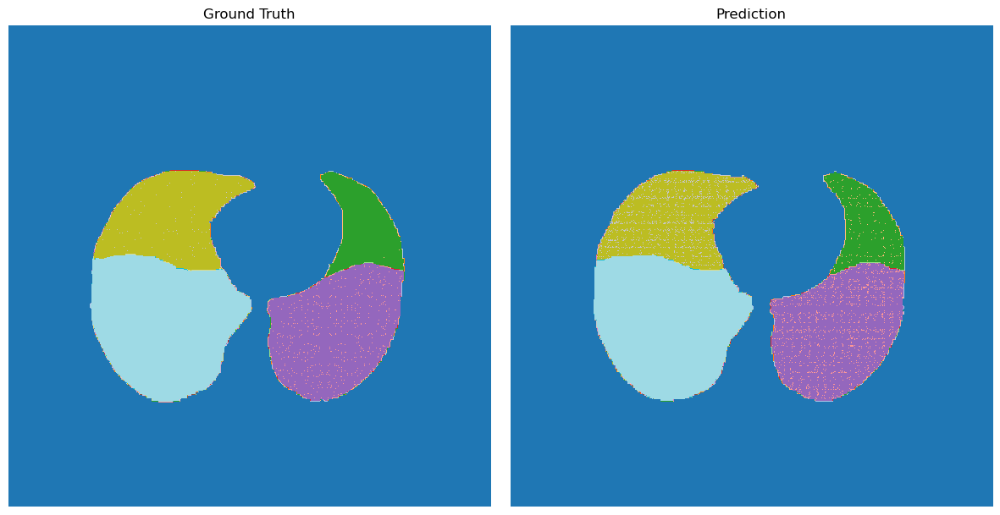

In [ ]:
import nibabel as nib
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np

# Load prediction
pred = nib.load("output/ct_lobes.nii.gz").get_fdata()

# Load GT (NRRD)
gt_img = sitk.ReadImage("input/gt.nrrd")
gt = sitk.GetArrayFromImage(gt_img)      # [z,y,x] order
gt = np.transpose(gt, (2,1,0))           # -> [x,y,z]

# Pick slice
slice_idx = pred.shape[2] // 2
pred_slice = pred[:, :, slice_idx]
gt_slice   = gt[:, :, slice_idx]

# --- Correct orientation ---
pred_slice = np.rot90(pred_slice, 3)
gt_slice   = np.rot90(gt_slice, 3)

pred_slice = np.fliplr(pred_slice)
gt_slice   = np.fliplr(gt_slice)

# Plot
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(gt_slice, cmap='tab20')
plt.title("Ground Truth")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(pred_slice, cmap='tab20')
plt.title("Prediction")
plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
!python predict_normal.py -i input -o output_normal



2025-11-26 14:24:10.058008: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-26 14:24:10.110271: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-11-26 14:24:11.174962: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
Parameters: ['predict_normal.py', '-i', 'input', '-o', 'output_normal']
Input: i

(512, 512, 394)


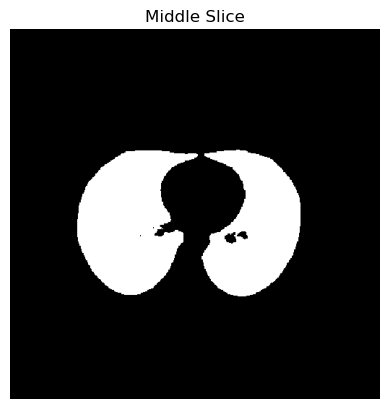

In [ ]:
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np

path = "output_normal/ct_lung.nii.gz"
img = nib.load(path)
arr = img.get_fdata()

print(arr.shape)

# Pick middle slice
mid = arr.shape[2] // 2
slice_img = arr[:, :, mid]

# --- Fix orientation ---
# 1. Rotate 90° clockwise  (rot=3)
slice_img = np.rot90(slice_img, 3)

# 2. Flip left–right so left lung is on the left
slice_img = np.fliplr(slice_img)

# Show
plt.imshow(slice_img, cmap='gray')
plt.title("Middle Slice")
plt.axis('off')
plt.show()


In [ ]:
import nibabel as nib
import numpy as np
import SimpleITK as sitk

# Load prediction (NIfTI)
pred_path = "output/ct_lobes.nii.gz"
pred = nib.load(pred_path).get_fdata().astype(np.int32)

# Load ground truth (NRRD or NIfTI)
gt_path = "/data/users/jupyter-shr624/annotations_HCU/annotations_HCU/locca_covid_003_label.nrrd" # <-- change if needed

gt_img = sitk.ReadImage(gt_path)
gt = sitk.GetArrayFromImage(gt_img).astype(np.int32)  # (z,y,x)

# Convert GT to (x,y,z) just like nib
gt = np.transpose(gt, (1,2,0))

print("Prediction shape:", pred.shape)
print("GT shape:", gt.shape)


Prediction shape: (512, 512, 456)
GT shape: (512, 512, 456)


In [ ]:
import SimpleITK as sitk
import numpy as np

pred_img = sitk.ReadImage("output/ct_lobes.nii.gz")
pred_arr = sitk.GetArrayFromImage(pred_img)


In [ ]:
gt_img = sitk.ReadImage("input/gt.nrrd")


In [ ]:
resampler = sitk.ResampleImageFilter()
resampler.SetReferenceImage(pred_img)
resampler.SetInterpolator(sitk.sitkNearestNeighbor)
resampled_gt_img = resampler.Execute(gt_img)

resampled_gt = sitk.GetArrayFromImage(resampled_gt_img)
resampled_gt = resampled_gt.astype(np.int32)
pred_arr = pred_arr.astype(np.int32)


In [ ]:
def dice(gt, pred, label):
    gt_mask = (gt == label)
    pred_mask = (pred == label)

    inter = np.logical_and(gt_mask, pred_mask).sum()
    denom = gt_mask.sum() + pred_mask.sum()

    if denom == 0:
        return np.nan
    return 2 * inter / denom

labels = {1:"LUL", 2:"LLL", 3:"RUL", 4:"RML", 5:"RLL"}

for lbl,name in labels.items():
    print(name, dice(resampled_gt, pred_arr, lbl))


LUL 0.9832973773544963
LLL 0.9821747158001894
RUL 0.9818202690433203
RML 0.9677895443336156
RLL 0.9810495343373674


In [ ]:
print("Pred shape:", pred_arr.shape)
print("GT shape:", gt.shape)
print("Resampled GT shape:", resampled_gt.shape)


Pred shape: (456, 512, 512)
GT shape: (512, 512, 456)
Resampled GT shape: (456, 512, 512)


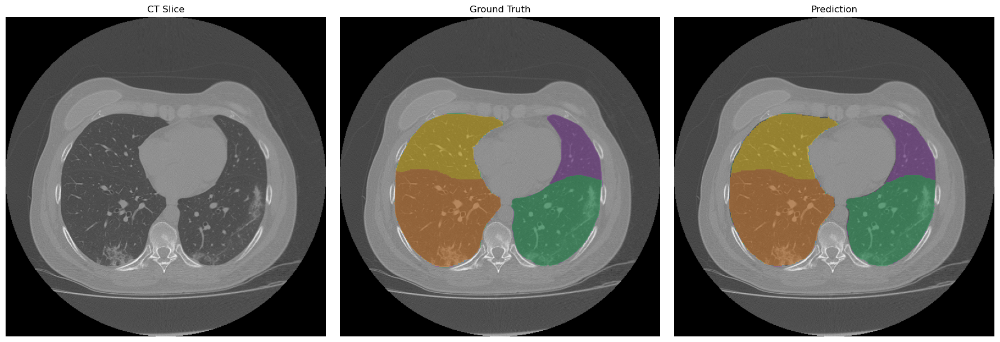

In [ ]:
import nibabel as nib
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap


# ===========================================================
# 1️⃣ Load volumes
# ===========================================================
ct = nib.load("input/ct.nii.gz").get_fdata()
pred = nib.load("output/ct_lobes.nii.gz").get_fdata()

gt_img = sitk.ReadImage("input/gt.nrrd")
gt = sitk.GetArrayFromImage(gt_img)    # [z, y, x]


# ===========================================================
# 2️⃣ Fix GT orientation: [z, y, x] -> [x, y, z]
# ===========================================================
gt = np.transpose(gt, (2, 1, 0))


# ===========================================================
# 3️⃣ Choose slice
# ===========================================================
slice_idx = ct.shape[2] // 2

ct_slice = ct[:, :, slice_idx]
gt_slice = gt[:, :, slice_idx]
pred_slice = pred[:, :, slice_idx]


# ===========================================================
# 4️⃣ Define custom colors for lobes
# ===========================================================
colors = [
    (0,0,0,0),       # background transparent
    "#8e44ad",       # 1 - purple
    "#27ae60",       # 2 - green
    "#3498db",       # 3 - blue
    "#f1c40f",       # 4 - yellow
    "#e67e22",       # 5 - orange
]

custom_cmap = ListedColormap(colors)


# ===========================================================
# 5️⃣ Correct orientation:
#    - Rotate 90° clockwise  (rot = 3)
#    - Flip horizontally     (left lung becomes left)
# ===========================================================
rot = 3

ct_slice_r   = np.rot90(ct_slice,   rot)
gt_slice_r   = np.rot90(gt_slice,   rot)
pred_slice_r = np.rot90(pred_slice, rot)

# Flip left–right to match clinical orientation
ct_slice_r   = np.fliplr(ct_slice_r)
gt_slice_r   = np.fliplr(gt_slice_r)
pred_slice_r = np.fliplr(pred_slice_r)


# ===========================================================
# 6️⃣ Visualization
# ===========================================================
plt.figure(figsize=(18, 6))

# --- CT ---
plt.subplot(1, 3, 1)
plt.title("CT Slice")
plt.imshow(ct_slice_r, cmap="gray")
plt.axis("off")

# --- GT ---
plt.subplot(1, 3, 2)
plt.title("Ground Truth")
plt.imshow(ct_slice_r, cmap="gray")
plt.imshow(gt_slice_r, cmap=custom_cmap, alpha=0.45)
plt.axis("off")

# --- Prediction ---
plt.subplot(1, 3, 3)
plt.title("Prediction")
plt.imshow(ct_slice_r, cmap="gray")
plt.imshow(pred_slice_r, cmap=custom_cmap, alpha=0.45)
plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
for s in range(0, ct.shape[2], 20):

    ct_slice = ct[:, :, s]
    pred_slice = pred[:, :, s]

    # --- Fix orientation ---
    # 1. Rotate 90° clockwise (rot = 3)
    ct_slice = np.rot90(ct_slice, 3)
    pred_slice = np.rot90(pred_slice, 3)

    # 2. Flip left-right
    ct_slice = np.fliplr(ct_slice)
    pred_slice = np.fliplr(pred_slice)

    # --- Plot ---
    plt.figure(figsize=(6,6))
    plt.imshow(ct_slice, cmap="gray")
    plt.imshow(pred_slice, alpha=0.4, cmap='tab20')
    plt.title(f"Slice {s}")
    plt.axis("off")
    plt.show()

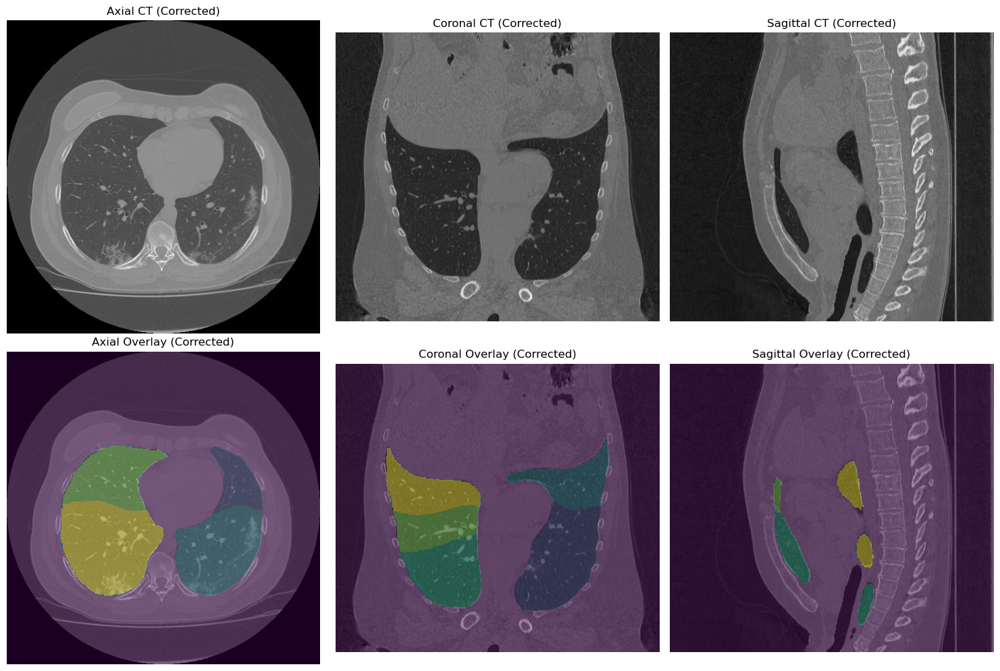

In [ ]:
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np

# Load files
ct = nib.load("input/ct.nii.gz").get_fdata()
pred = nib.load("output/ct_lobes.nii.gz").get_fdata()

# Normalize CT
ct_norm = (ct - np.min(ct)) / (np.max(ct) - np.min(ct))

# Slice indices
axial_idx = ct.shape[2] // 2
coronal_idx = ct.shape[1] // 2
sagittal_idx = ct.shape[0] // 2

plt.figure(figsize=(15,10))

# ===========================================================
# 🟦 1. AXIAL VIEW (correct)
# ===========================================================
ax_ct = np.rot90(ct_norm[:, :, axial_idx], 3)
ax_ct = np.fliplr(ax_ct)

ax_pred = np.rot90(pred[:, :, axial_idx], 3)
ax_pred = np.fliplr(ax_pred)

plt.subplot(2,3,1)
plt.title("Axial CT (Corrected)")
plt.imshow(ax_ct, cmap="gray")
plt.axis("off")

plt.subplot(2,3,4)
plt.title("Axial Overlay (Corrected)")
plt.imshow(ax_ct, cmap="gray")
plt.imshow(ax_pred, alpha=0.4)
plt.axis("off")


# ===========================================================
# 🟩 2. CORONAL VIEW (needs left-right flip)
# ===========================================================
cor_ct = np.rot90(ct_norm[:, coronal_idx, :], 3)
cor_ct = np.fliplr(cor_ct)   # << FIX

cor_pred = np.rot90(pred[:, coronal_idx, :], 3)
cor_pred = np.fliplr(cor_pred)   # << FIX

plt.subplot(2,3,2)
plt.title("Coronal CT (Corrected)")
plt.imshow(cor_ct, cmap="gray")
plt.axis("off")

plt.subplot(2,3,5)
plt.title("Coronal Overlay (Corrected)")
plt.imshow(cor_ct, cmap="gray")
plt.imshow(cor_pred, alpha=0.4)
plt.axis("off")


# ===========================================================
# 🟥 3. SAGITTAL VIEW (needs left-right flip)
# ===========================================================
sag_ct = np.rot90(ct_norm[sagittal_idx, :, :], 3)
sag_ct = np.fliplr(sag_ct)   # << FIX

sag_pred = np.rot90(pred[sagittal_idx, :, :], 3)
sag_pred = np.fliplr(sag_pred)   # << FIX

plt.subplot(2,3,3)
plt.title("Sagittal CT (Corrected)")
plt.imshow(sag_ct, cmap="gray")
plt.axis("off")

plt.subplot(2,3,6)
plt.title("Sagittal Overlay (Corrected)")
plt.imshow(sag_ct, cmap="gray")
plt.imshow(sag_pred, alpha=0.4)
plt.axis("off")


plt.tight_layout()
plt.show()


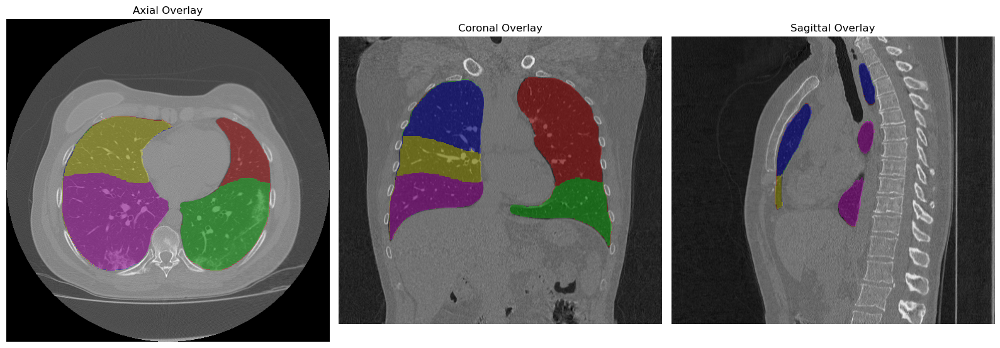

In [ ]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Load CT + prediction
ct = nib.load("input/ct.nii.gz").get_fdata()
pred = nib.load("output/ct_lobes.nii.gz").get_fdata()

# Normalize CT
ct_norm = (ct - np.min(ct)) / (np.max(ct) - np.min(ct))

# Color map for 6 classes
colors = np.array([
    [0, 0, 0, 0],        # background
    [1, 0, 0, 0.5],      # red
    [0, 1, 0, 0.5],      # green
    [0, 0, 1, 0.5],      # blue
    [1, 1, 0, 0.5],      # yellow
    [1, 0, 1, 0.5],      # magenta
])
cmap = ListedColormap(colors)

# Slice locations
axial = ct.shape[2] // 2
coronal = ct.shape[1] // 2
sagittal = ct.shape[0] // 2

plt.figure(figsize=(16, 6))

# ===========================================================
# 🟦 AXIAL (correct -> rotate right + flip LR)
# ===========================================================
ax_ct = np.rot90(ct_norm[:, :, axial], 3)
ax_ct = np.fliplr(ax_ct)

ax_pred = np.rot90(pred[:, :, axial], 3)
ax_pred = np.fliplr(ax_pred)

plt.subplot(1, 3, 1)
plt.title("Axial Overlay")
plt.imshow(ax_ct, cmap="gray")
plt.imshow(ax_pred, cmap=cmap, alpha=0.6)
plt.axis("off")


# ===========================================================
# 🟩 CORONAL (rotate right + flip LR + flip UD)
# ===========================================================
cor_ct = np.rot90(ct_norm[:, coronal, :], 3)
cor_ct = np.fliplr(cor_ct)   # left/right
cor_ct = np.flipud(cor_ct)   # top/bottom

cor_pred = np.rot90(pred[:, coronal, :], 3)
cor_pred = np.fliplr(cor_pred)
cor_pred = np.flipud(cor_pred)

plt.subplot(1, 3, 2)
plt.title("Coronal Overlay")
plt.imshow(cor_ct, cmap="gray")
plt.imshow(cor_pred, cmap=cmap, alpha=0.6)
plt.axis("off")


# ===========================================================
# 🟥 SAGITTAL (rotate right + flip LR + flip UD)
# ===========================================================
sag_ct = np.rot90(ct_norm[sagittal, :, :], 3)
sag_ct = np.fliplr(sag_ct)   # left/right
sag_ct = np.flipud(sag_ct)   # top/bottom

sag_pred = np.rot90(pred[sagittal, :, :], 3)
sag_pred = np.fliplr(sag_pred)
sag_pred = np.flipud(sag_pred)

plt.subplot(1, 3, 3)
plt.title("Sagittal Overlay")
plt.imshow(sag_ct, cmap="gray")
plt.imshow(sag_pred, cmap=cmap, alpha=0.6)
plt.axis("off")


plt.tight_layout()
plt.show()


In [ ]:
!pip install plotly scikit-image nibabel


Defaulting to user installation because normal site-packages is not writeable


In [ ]:
import nibabel as nib
import numpy as np
import plotly.graph_objects as go
from skimage import measure
import os

# -----------------------------
# Load your segmentation
# -----------------------------
seg_path = "output/ct_lobes.nii.gz"
seg_img = nib.load(seg_path).get_fdata()

labels = {
    1: "LUL",
    2: "LLL",
    3: "RUL",
    4: "RML",
    5: "RLL"
}

colors = {
    1: "red",
    2: "green",
    3: "blue",
    4: "yellow",
    5: "purple"
}

# -----------------------------
# Build 3D mesh figure
# -----------------------------
fig = go.Figure()

print("Extracting 3D meshes...")

for lobe_label, lobe_name in labels.items():
    mask = (seg_img == lobe_label).astype(np.uint8)

    if mask.sum() == 0:
        continue

    verts, faces, _, _ = measure.marching_cubes(mask, 0)

    fig.add_trace(go.Mesh3d(
        x=verts[:, 0], y=verts[:, 1], z=verts[:, 2],
        i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
        name=lobe_name,
        opacity=0.6,
        color=colors[lobe_label]
    ))

# -----------------------------
# Create rotating animation frames
# -----------------------------
frames = []
for angle in range(0, 360, 4):  # 90 frames = smooth 360° rotation
    frames.append(go.Frame(layout=dict(
        scene_camera=dict(eye=dict(
            x=2*np.cos(np.radians(angle)),
            y=2*np.sin(np.radians(angle)),
            z=0.5
        ))
    )))

fig.frames = frames

# Animation settings
fig.update_layout(
    title="Rotating 3D Lung Lobes",
    width=800,
    height=800,
    scene=dict(xaxis=dict(visible=False),
               yaxis=dict(visible=False),
               zaxis=dict(visible=False),
               aspectmode="data"),
    updatemenus=[dict(
        type="buttons",
        buttons=[dict(label="Rotate",
                      method="animate",
                      args=[None, dict(frame=dict(duration=50, redraw=True),
                                       fromcurrent=True)])]
    )]
)

fig.show()

# -----------------------------
# Save animation as MP4
# -----------------------------
print("Saving MP4...")

fig.write_html("lung_lobes_animation.html")  # interactive
fig.write_image("lung_lobes_rotation.png")   # static
# MP4 export:
fig.write_html("lung_lobes_animation.html")

print("Done!")


In [ ]:
import nibabel as nib
import numpy as np

seg = nib.load("output/ct_lobes.nii.gz").get_fdata()
print("Unique labels:", np.unique(seg))


Unique labels: [0. 1. 2. 3. 4. 5.]


In [ ]:
for l in range(6):
    print(f"Label {l} → voxels:", int((seg == l).sum()))


Label 0 → voxels: 95596831
Label 1 → voxels: 1886567
Label 2 → voxels: 1705609
Label 3 → voxels: 1538353
Label 4 → voxels: 558118
Label 5 → voxels: 1999258


In [ ]:
from skimage.measure import marching_cubes

mask = (seg == 1).astype(np.uint8)  # LUL
print("Mask sum =", mask.sum())

verts, faces, _, _ = marching_cubes(mask, 0)
print("Verts:", len(verts))
print("Faces:", len(faces))


Mask sum = 1886567
Verts: 161762
Faces: 323526


In [ ]:
import numpy as np
import SimpleITK as sitk
import plotly.graph_objects as go
from skimage.measure import marching_cubes
import nibabel as nib

# --- LOAD FILES ---
pred = nib.load("output/ct_lobes.nii.gz").get_fdata()

gt_sitk = sitk.ReadImage("input/gt.nrrd")
gt = sitk.GetArrayFromImage(gt_sitk)   # (D,H,W)

# --- FIX ORIENTATION to match prediction ---
gt = gt.transpose(1, 2, 0)  # now (H, W, D)

print("Prediction shape:", pred.shape)
print("GT (fixed) shape:", gt.shape)

# Choose label to visualize (1..5)
label = 1

# --- BUILD MASK FROM GROUND TRUTH ---
mask = (gt == label).astype(np.uint8)

# Extract surface
verts, faces, _, _ = marching_cubes(mask, 0)
i, j, k = faces.T

# --- PLOT ---
fig = go.Figure()

fig.add_trace(go.Mesh3d(
    x=verts[:, 0],
    y=verts[:, 1],
    z=verts[:, 2],
    i=i, j=j, k=k,
    opacity=0.5,
    color="red",
    name=f"GT Lobe {label}"
))

fig.update_layout(
    title=f"3D Rendering of GT Lobe {label}",
    width=900,
    height=900,
    scene=dict(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False),
        aspectmode="data"
    )
)

fig.show()


Prediction shape: (512, 512, 394)
GT (fixed) shape: (512, 512, 394)


In [ ]:
%cd /data/users/jupyter-shr624/LobePrior_Project/Lobeprior

[Errno 2] No such file or directory: '/data/users/jupyter-shr624/LobePrior_Project/Lobeprior'
/data/users/jupyter-shr624/LobePrior_Project


In [ ]:
%cd /data/users/jupyter-shr624/LobePrior_Project/LobePrior/


/data/users/jupyter-shr624/LobePrior_Project/LobePrior
